In [1]:
import numpy as np
import pandas as pd
import plotly
import plotly.express as px
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import json
import copy
from plotly.subplots import make_subplots
from scipy.spatial.distance import cosine
from sklearn.preprocessing import normalize
from datetime import datetime

In [2]:
data = json.load(open('research/output/youtube_data.json'))

In [3]:
limit = 5

for index, (video_tag, annots) in enumerate(data.items()):
    print(data[video_tag]["commentCount"])
    # print(video["statistics"])
    if index >= limit:
        break

0
0
0
39
2
78


In [4]:
persuasions = ["Social Identity", "Concreteness", "Anchoring and Comparison", "Overcoming Reactance", "Reciprocity",
"Foot in the Door", "Authority", "Social Impact", "Anthropomorphism", "Scarcity", "Social Proof", "Unclear"]
sector_list = {"Technology": "#19A7CE", 
               "Media": "#F24C3D", 
               "Retailing and Apparel": "#F2BE22", 
               "Finance": "#00DFA2", 
               "Food and Household": "#F97B22", 
               "Wholesalers, Industrials and Energy": "#77037B", 
               "Transportation": "#413543",
               "Aerospace and Defence": "#090580",
               "Healthcare": "#FFACAC"}
year_list = ["Before 2014", '2014', '2015', '2016', '2017', '2018', '2019', '2020', '2021', '2022']

In [5]:
frequency = {}
for video, values in data.items():
    for i, strat in enumerate(values["annots"]):
        if strat not in frequency:
            frequency[strat] = {"overall":0}
        frequency[strat]["overall"] += 1

In [6]:
df = pd.DataFrame.from_dict(frequency).T

# General

### Frequency of strategies"

In [ ]:
fig = px.pie(df, values='overall', names = df.T.columns)
fig.update_layout({
    "plot_bgcolor": "rgba(0,0,0,0)",
    "paper_bgcolor": "rgba(0,0,0,0)"
})
fig.show()

In [ ]:
fig = px.bar(df, x="overall", color_discrete_sequence=["#090580"])

fig.update_layout({
    "plot_bgcolor": "rgba(0,0,0,0)",
    "paper_bgcolor": "rgba(0,0,0,0)"
})
fig.show()
# plotly.offline.plot({"data": fig}, filename = "Frequency of strategies.html")

# Temporal Analysis

In [8]:
companies = {}
for video, values in data.items():
    company = values["channelTitle"]
    if company not in companies:
        companies[company] = {"count":0, "videos":{}}
    y = values["publishedAt"][0:4]
    if int(y) <= 2013:
        y = "Before 2014"
    companies[company]["count"] += 1
    companies[company]["videos"][video] = {"annots":values["annots"], "publishedAt":values["publishedAt"], "publishedIn": y, "likeCount": values["likeCount"],
                                         "viewCount":values["viewCount"], "videoTag":"video "+str(companies[company]["count"]), "commentCount":values["commentCount"]}
companies = dict(sorted(companies.items(), key=lambda item: item[0]))

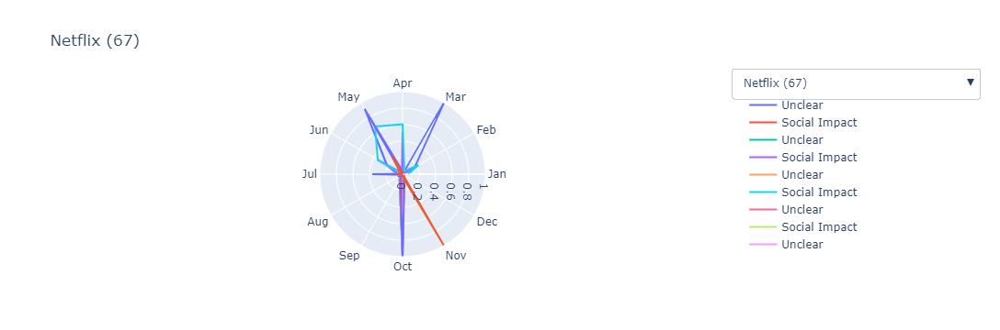

In [330]:
import plotly.graph_objects as go
from datetime import datetime
import numpy as np

polar_graphs = []
num_companies = len(companies)
plot_dicts = []
top_5_polar_plots = []
j = 0

# Initialize a dictionary to store data by strategy and month
data_by_strategy_and_month = {}

months = ["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"]
angles = [i * (360 / len(months)) for i in range(len(months))]

for company, content in companies.items():
    company_views = {}
    company_likes = {}
    company_comments = {}
    video_frequency = {}

    for pers in persuasions:
        company_views[pers] = 0
        company_likes[pers] = 0
        video_frequency[pers] = 0

    for video, values in content["videos"].items():
        strats = values["annots"]
        viewcount = values["viewCount"]
        likes = values["likeCount"]
        date = values["publishedAt"]
        month = datetime.strptime(date, "%Y-%m-%dT%H:%M:%SZ").month

        for strat in strats:
            if strat not in data_by_strategy_and_month:
                data_by_strategy_and_month[strat] = {month: 0 for month in range(1, 13)}
            
            data_by_strategy_and_month[strat][month] += likes

    strat_names = list(data_by_strategy_and_month.keys())

    if j == 0:
        visible_action = True
    else:
        visible_action = False

    # Create traces for each strategy
    traces = []

    for strat in strat_names:
        likes_for_strat = [data_by_strategy_and_month[strat][month] for month in range(1, 13)]

        # Normalize the values between 0 and 1
        max_likes = max(likes_for_strat)
        if max_likes != 0:
            likes_for_strat = [x / max_likes for x in likes_for_strat]

        trace = go.Scatterpolar(
            r=likes_for_strat,
            theta=angles,
            mode='lines',
            name=f"{strat}",
            visible=visible_action
        )

        traces.append(trace)

    polar_graphs.extend(traces)

    if company in top_5_company_names:
        top_5_polar_plots.extend(traces[-len(strat_names):])

    visibility = [False] * num_companies
    visibility[j] = True
    d = dict(args=[{"visible": visibility}, {"title": company + " (" + str(content["count"]) + ")"}],
             label=company + " (" + str(content["count"]) + ")", method="update")
    plot_dicts.append(d)
    j += 1

fig = go.Figure(data=polar_graphs)

fig.update_layout(
    polar=dict(
        angularaxis=dict(
            tickmode='array',
            tickvals=angles,
            ticktext=months
        ),
        radialaxis=dict(
            range=[0, 1]  # Set the range for the radial axis between 0 and 1
        )
    )
)

fig.update_layout(
    updatemenus=[dict(buttons=plot_dicts,
                      pad={"r": 10, "t": 10},
                      showactive=True,
                      x=1,
                      xanchor="left",
                      y=1.2,
                      yanchor="top")]
)

fig.show()


In [312]:
print(data_by_strategy_and_month["Concreteness"])

{1: 5386, 2: 12056, 3: 35805, 4: 7594, 5: 96978, 6: 20139, 7: 74853, 8: 30974, 9: 43986, 10: 36427, 11: 267040, 12: 8874}


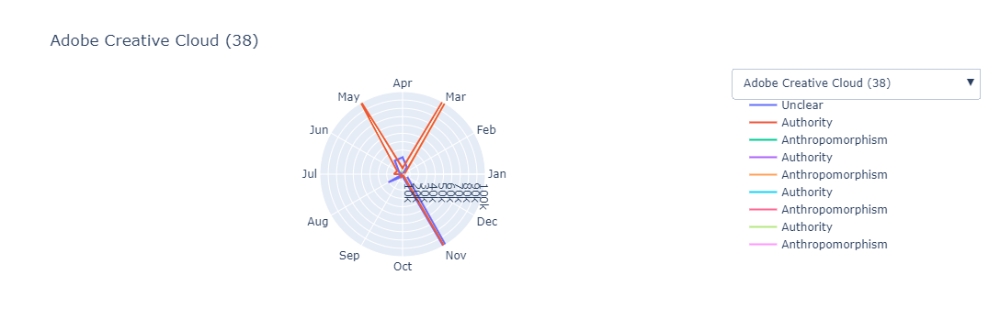

In [329]:
import plotly.graph_objects as go
from datetime import datetime

polar_graphs = []
num_companies = len(companies)
plot_dicts = []
top_5_polar_plots = []
j = 0

# Initialize a dictionary to store data by strategy and month
data_by_strategy_and_month = {}

months = ["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"]
angles = [i * (360 / len(months)) for i in range(len(months))]

for company, content in companies.items():
    company_views = {}
    company_likes = {}
    company_comments = {}
    video_frequency = {}

    for pers in persuasions:
        company_views[pers] = 0
        company_likes[pers] = 0
        video_frequency[pers] = 0

    for video, values in content["videos"].items():
        strats = values["annots"]
        viewcount = values["viewCount"]
        likes = values["likeCount"]
        date = values["publishedAt"]
        month = datetime.strptime(date, "%Y-%m-%dT%H:%M:%SZ").month

        for strat in strats:
            if strat not in data_by_strategy_and_month:
                data_by_strategy_and_month[strat] = {month: 0 for month in range(1, 13)}
            
            data_by_strategy_and_month[strat][month] += likes

    strat_names = list(data_by_strategy_and_month.keys())

    if j == 0:
        visible_action = True
    else:
        visible_action = False

    # Create traces for each strategy
    traces = []

    for strat in strat_names:
        likes_for_strat = [data_by_strategy_and_month[strat][month] for month in range(1, 13)]  # Remove the extra list

        trace = go.Scatterpolar(
            r=likes_for_strat,
            theta=angles,
            mode='lines',
            name=f"{strat}",
            visible=visible_action
        )

        traces.append(trace)

    polar_graphs.extend(traces)

    if company in top_5_company_names:
        top_5_polar_plots.extend(traces[-len(strat_names):])

    visibility = [False] * num_companies
    visibility[j] = True
    d = dict(args=[{"visible": visibility}, {"title": company + " (" + str(content["count"]) + ")"}],
             label=company + " (" + str(content["count"]) + ")", method="update")
    plot_dicts.append(d)
    j += 1

fig = go.Figure(data=polar_graphs)

radialaxis_range = [1000, 100000]

fig.update_layout(
    polar=dict(
        angularaxis=dict(
            tickmode='array',
            tickvals=angles,
            ticktext=months
        ),
        radialaxis=dict(
            range=radialaxis_range  # Set the range for the radial axis
        )
    )
)

fig.update_layout(
    updatemenus=[dict(buttons=plot_dicts,
                      pad={"r": 10, "t": 10},
                      showactive=True,
                      x=1,
                      xanchor="left",
                      y=1.2,
                      yanchor="top")]
)

fig.show()


In [322]:
print(likes_for_strat)
print(data_by_strategy_and_month["Concreteness"])

[[2148, 462, 1817, 18161, 43766, 9175, 2843, 2428, 4740, 6229, 2254, 8257]]
{1: 5386, 2: 12056, 3: 35805, 4: 7594, 5: 96978, 6: 20139, 7: 74853, 8: 30974, 9: 43986, 10: 36427, 11: 267040, 12: 8874}


# Company-wise

## Persuasion Strategies used within same company

In [11]:
companies = {}
for video, values in data.items():
    company = values["channelTitle"]
    if company not in companies:
        companies[company] = {"count":0, "videos":{}}
    y = values["publishedAt"][0:4]
    if int(y) <= 2013:
        y = "Before 2014"
    companies[company]["count"] += 1
    companies[company]["videos"][video] = {"annots":values["annots"], "publishedIn": y, "likeCount": values["likeCount"],
                                         "viewCount":values["viewCount"], "videoTag":"video "+str(companies[company]["count"]), "commentCount":values["commentCount"]}
companies = dict(sorted(companies.items(), key=lambda item: item[0]))

In [ ]:
l1 = list(companies.keys())
l2 = list(companies.values())
l1, l2 = zip(*sorted(zip(l1, l2)))
temp = {}
for i in range(len(l1)):
    temp[l1[i]] = l2[i]
companies = temp

In [12]:
top_5_companies = sorted(companies.items(), key=lambda x: x[1]["count"], reverse=True)[:5]
top_5_company_names = [company[0] for company in top_5_companies]

## Frequency of strategies for each company

In [ ]:
def append_in_df(df, columns, data):
    append_list = {}
    for i in range(len(columns)):
        append_list[columns[i]] = data[i]
    row_to_append = pd.DataFrame([append_list])
    df = pd.concat([df,row_to_append])
    return df

In [ ]:
graphs = []
num_companies = len(companies)
plot_dicts = []
j = 0
df_a1 = pd.DataFrame(columns=['company', 
                              'Number of Advertisements',
                              'Is it same across all the advertisements', 
                              'Strategy with most occurence',
                              'Strategies with more than 50%',
                              'Variability',
                              '# Unclear',
                             '% Unclear'])
for company, content in companies.items():
    company_strats = {}
    appearing_videos = {}
    for pers in persuasions:
        company_strats[pers] = 0
        appearing_videos[pers] = ""
    
    for video, values in content["videos"].items():
        strats = values["annots"]
        name = values["videoTag"]
        for strat in strats:
            company_strats[strat] += 1
            appearing_videos[strat] += values["videoTag"] + ", "
    
    l1 = list(company_strats.keys())
    l2 = list(company_strats.values())
    l3 = list(appearing_videos.values())
    visibility = [False]*num_companies
    visibility[j] = True
    
    index = np.argmax(l2)
    num_videos = len(content["videos"])
    more_strategies = ""
    if num_videos <= 4:
        c3_value = "data is less"
    else:
        if l2[index]/num_videos >= 0.8:
            c3_value = "Almost all"
        else:
            c3_value = "Varies"
    entropy = 1
    if c3_value == "data is less":
        c4_value = "None"
        more_strategies = "None"
    else:
        for strat, val in company_strats.items():
            if val/num_videos >= 0.5 and strat != l1[index]:
                more_strategies += strat + ", "
            entropy -= (val/np.sum(l2))**2
        c4_value = l1[index] + " (" + str(l2[index]/num_videos) + ")"
    
    if len(more_strategies) == 0:
        more_strategies = "None"
    if entropy == 1:
        entropy = "None"
        
    insert_data = [company, len(content["videos"]), c3_value, c4_value, more_strategies, entropy, l2[-1], l2[-1]/num_videos]
    df_a1 = append_in_df(df_a1, df_a1.columns, insert_data)
    d = dict(args=[{"visible": visibility}, {"title": company + " (" + str(content["count"]) + ")"}], 
             label=company + " (" + str(content["count"]) + ")", method="update")
    if j == 0:
        visible_action = True
    else:
        visible_action = False
    graphs.append(go.Bar(x=l1, y=l2, text=l3, textposition = "none", name=company, 
                         hovertemplate = "%{text}", visible = visible_action))
    plot_dicts.append(d)
    j+=1

# fig = go.Figure(data = graphs)
# fig.update_layout(
#     updatemenus=[dict(buttons= plot_dicts,
#                       pad={"r": 10, "t": 10},
#                       showactive=True,
#                       x=1,
#                       xanchor="left",
#                       y=1.2,
#                       yanchor="top")]
# )
# fig.update_layout({
#     "plot_bgcolor": "rgba(0,0,0,0)",
#     "paper_bgcolor": "rgba(0,0,0,0)"
# })
# fig.show()
# plotly.offline.plot({"data": fig}, filename = "Frequency of strategies for each company.html")

In [ ]:
df_a1.to_csv("Frequency of strategies for each company.csv")
df_a1

## Trend of each strategy along the years for each company

In [ ]:
plot_dicts_facets = []
thresh = 20
num_companies = 0
time_information = {"quantity":{}, "proportions":{}}
for company, content in companies.items():
    if len(content["videos"]) >= thresh:
        num_companies+=1
        
for company, content in companies.items():
    if len(content["videos"]) >= thresh:
        company_timeline = {}
        num_videos_per_year = {}
        for pers in persuasions:
            company_timeline[pers] = {}
            for year in year_list:
                company_timeline[pers][year] = 0
                num_videos_per_year[year] = 0

        for video, values in content["videos"].items():
            strats = values["annots"]
            year = values["publishedIn"]
            num_videos_per_year[year] += 1
            for strat in strats:
                company_timeline[strat][year] += 1
        
        time_information["quantity"][company] = copy.deepcopy(company_timeline)
        for pers in persuasions:
            for year in year_list:
                if num_videos_per_year[year] != 0:
                    company_timeline[pers][year] /= num_videos_per_year[year]
        time_information["proportions"][company] = company_timeline
        l2 = []
        for strat, years in company_timeline.items():
            buff = []
            for year, freq in years.items():
                buff.append(freq)
            l2.append(buff)
        
        buff_graphs = []
        plot_dicts = []
        
        for i, pers in enumerate(persuasions):
            visibility = [False]*len(persuasions)
            visibility[i] = True
            if i == 0:
                visible_action = True
            else:
                visible_action = False
            buff_graphs.append(go.Scatter(x=year_list, y=l2[i], name=pers, line={ 'width': 2},visible =  visible_action))
            d = dict(args=[{"visible": visibility}, {"title": company + " (" + str(content["count"]) + ")"}], 
                 label=pers, method="update")
            plot_dicts.append(d)
#         fig = go.Figure(data = buff_graphs)
#         fig.update_layout(
#             updatemenus=[
#                 dict(buttons= plot_dicts,
#                               pad={"r": 10, "t": 10},
#                               showactive=True,
#                               x=1,
#                               xanchor="left",
#                               y=1.2,
#                               yanchor="top")
#             ]
#         )

#         fig.show()
#         plotly.offline.plot({"data": fig}, filename = company +".html")

In [ ]:
df_quantity = {}
df_proportions = {}

for pers in persuasions:
    df_quantity[pers] = {}
    df_proportions[pers] = {}
    for year in year_list:
        df_quantity[pers][year] = ""
        df_proportions[pers][year] = ""
        
for pers in persuasions:
    for year in year_list:
        temp_list = []
        temp_list2 = []
        company_n = []
        company_n2 = []
        for company, details in time_information["quantity"].items():
            temp_list.append(details[pers][year])
            company_n.append(company)
        for company, details in time_information["proportions"].items():
            temp_list2.append(details[pers][year])
            company_n2.append(company)
            
        temp_list, company_n = zip(*sorted(zip(temp_list, company_n), reverse = True))
        df_quantity[pers][year] = company_n[0] + "(" + str(temp_list[0]) + "), " + company_n[1] + "(" + str(temp_list[1]) + "), " + company_n[2] + "(" + str(temp_list[2]) + ")" 
        
        temp_list2, company_n2 = zip(*sorted(zip(temp_list2, company_n2), reverse = True))
        df_proportions[pers][year] = company_n2[0] + "(" + str(round(temp_list2[0],2)) + "), " + company_n2[1] + "(" + str(round(temp_list2[1], 2)) + "), " + company_n2[2] + "(" + str(round(temp_list2[2], 2)) + ")" 
        
df_quantity = pd.DataFrame.from_dict(df_quantity)
df_proportions = pd.DataFrame.from_dict(df_proportions)

In [ ]:
df_quantity
df_quantity.to_csv("Year vs strategy table (quantity).csv")

In [ ]:
df_proportions
df_proportions.to_csv("Year vs strategy table (proportions).csv")

## Likes and Views Metrics

In [25]:
graphs_v = []
graphs_l = []
num_companies = len(companies)
plot_dicts = []
top_5_likes = []
j = 0
for company, content in companies.items():    
    company_views = {}
    company_likes = {}
    video_frequency = {}
    for pers in persuasions:
        company_views[pers] = 0
        company_likes[pers] = 0
        video_frequency[pers] = 0

    for video, values in content["videos"].items():
        strats = values["annots"]
        viewcount = values["viewCount"]
        likes = values["likeCount"]
        for strat in strats:
            video_frequency[strat] += 1
            company_views[strat] += viewcount
            company_likes[strat] += likes
    
#     for key in company_views:
#         if video_frequency[key] != 0:
#             company_views[key] /= video_frequency[key]
#             company_likes[key] /= video_frequency[key]
    
    strat_names = []
    v = []
    l = []
    for key in company_views:
        if company_views[key] == 0 and company_likes[key] == 0:
            pass
        else:
            strat_names.append(key)
            v.append(company_views[key])
            l.append(company_likes[key])
    if j == 0:
        visible_action = True
    else:
        visible_action = False
            
    g = go.Pie(labels=strat_names, values=v, name = company, visible = visible_action)
    graphs_v.append(g)
    
    g = go.Pie(labels=strat_names, values=l, name = company, visible = visible_action)
    graphs_l.append(g)
    
    if company in top_5_company_names:
        top_5_likes.append(g)

    visibility = [False]*num_companies
    visibility[j] = True
    d = dict(args=[{"visible": visibility}, {"title": company + " (" + str(content["count"]) + ")"}], 
             label=company + " (" + str(content["count"]) + ")", method="update")
    plot_dicts.append(d)
    j+=1

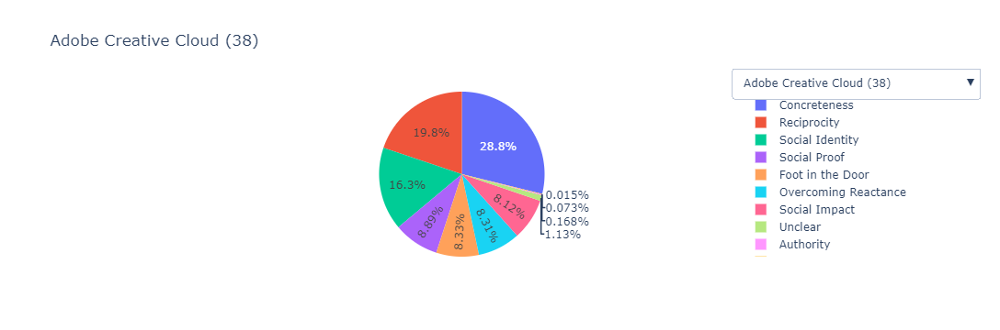

In [26]:
fig = go.Figure(data = graphs_v)
fig.update_layout(
    updatemenus=[dict(buttons= plot_dicts,
                      pad={"r": 10, "t": 10},
                      showactive=True,
                      x=1,
                      xanchor="left",
                      y=1.2,
                      yanchor="top")]
)
fig.show()
# plotly.offline.plot({"data": fig}, filename = "Trend of number of views per video gathered by each company.html")

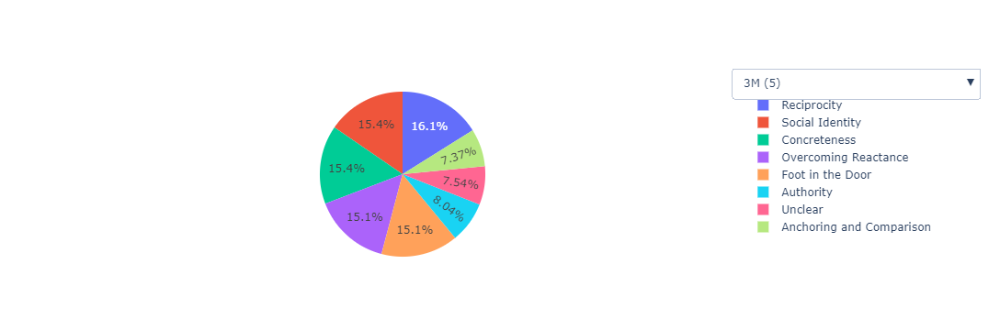

In [27]:
fig = go.Figure(data = graphs_l)
fig.update_layout(
    updatemenus=[dict(buttons= plot_dicts,
                      pad={"r": 10, "t": 10},
                      showactive=True,
                      x=1,
                      xanchor="left",
                      y=1.2,
                      yanchor="top")]
)
fig.show()
# plotly.offline.plot({"data": fig}, filename = "Trend of number of likes per video gathered by each company.html")

### Likes-to-views ratio by company

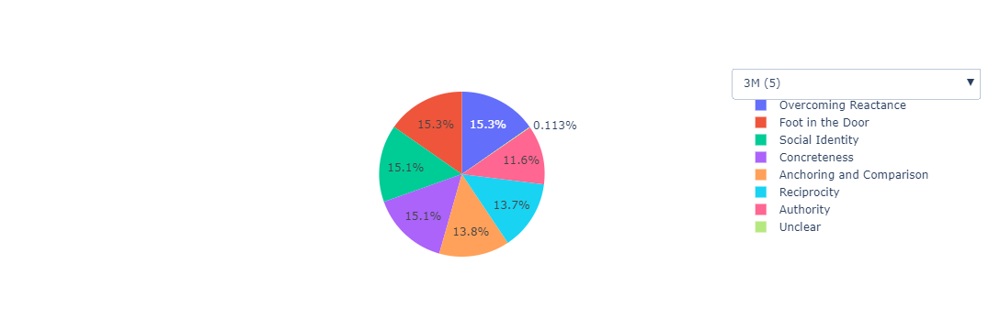

In [28]:
import plotly.graph_objects as go

pie_graphs = []
num_companies = len(companies)
plot_dicts = []
top_5_likes_to_views = []
j = 0
for company, content in companies.items():    
    company_views = {}
    company_likes = {}
    video_frequency = {}
    for pers in persuasions:
        company_views[pers] = 0
        company_likes[pers] = 0
        video_frequency[pers] = 0

    for video, values in content["videos"].items():
        strats = values["annots"]
        viewcount = values["viewCount"]
        likes = values["likeCount"]
        for strat in strats:
            video_frequency[strat] += 1
            company_views[strat] += viewcount
            company_likes[strat] += likes
    
    strat_names = []
    like_to_views_ratios = []
    for key in company_views:
        if company_views[key] == 0:
            ratio = 0  # Avoid division by zero
        else:
            ratio = company_likes[key] / company_views[key]
        
        # Only include the strategy if the ratio is not zero
        if ratio != 0:
            strat_names.append(key)
            like_to_views_ratios.append(ratio)
    
    if j == 0:
        visible_action = True
    else:
        visible_action = False
            
    g = go.Pie(labels=strat_names, values=like_to_views_ratios, name=company, visible=visible_action)
    pie_graphs.append(g)
    
    if company in top_5_company_names:
        top_5_likes_to_views.append(g)

    visibility = [False] * num_companies
    visibility[j] = True
    d = dict(args=[{"visible": visibility}, {"title": company + " (" + str(content["count"]) + ")"}], 
             label=company + " (" + str(content["count"]) + ")", method="update")
    plot_dicts.append(d)
    j += 1

fig = go.Figure(data=pie_graphs)
fig.update_layout(
    updatemenus=[dict(buttons=plot_dicts,
                      pad={"r": 10, "t": 10},
                      showactive=True,
                      x=1,
                      xanchor="left",
                      y=1.2,
                      yanchor="top")]
)

fig.show()


In [ ]:
# plotly.offline.plot({"data": fig}, filename = "Likes-to-Views ratio by each company.html")

## Comments and Views Metrics

### Comment count across persuasion strategies by each company

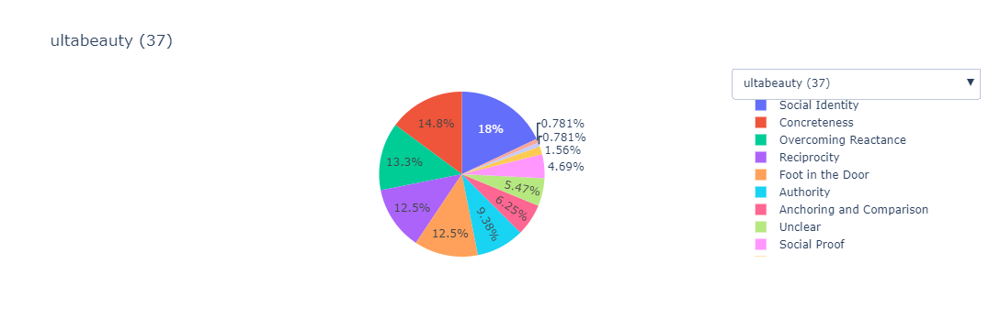

In [13]:
graphs_c = []  # Create a list for comments data
num_companies = len(companies)
plot_dicts = []
top_5_comments = []
j = 0

for company, content in companies.items():    
    company_comments = {}  # Change variable names to represent comments
    video_frequency = {}
    
    for pers in persuasions:
        company_comments[pers] = 0
        video_frequency[pers] = 0

    for video, values in content["videos"].items():
        strats = values["annots"]
        comments = values["commentCount"]  # Get comment count instead of likes and views
        for strat in strats:
            video_frequency[strat] += 1
            company_comments[strat] += comments
    
    strat_names = []
    c = []  # Change variable names to represent comments
    for key in company_comments:
        if company_comments[key] != 0:
            strat_names.append(key)
            c.append(company_comments[key])
    
    if j == 0:
        visible_action = True
    else:
        visible_action = False
            
    g = go.Pie(labels=strat_names, values=c, name=company, visible=visible_action)  # Change variable names
    graphs_c.append(g)
    
    if company in top_5_company_names:
        top_5_comments.append(g)

    visibility = [False] * num_companies
    visibility[j] = True
    d = dict(args=[{"visible": visibility}, {"title": company + " (" + str(content["count"]) + ")"}], 
             label=company + " (" + str(content["count"]) + ")", method="update")
    plot_dicts.append(d)
    j += 1

fig = go.Figure(data=graphs_c)
fig.update_layout(
    updatemenus=[dict(buttons=plot_dicts,
                      pad={"r": 10, "t": 10},
                      showactive=True,
                      x=1,
                      xanchor="left",
                      y=1.2,
                      yanchor="top")]
)
fig.show()


In [22]:
print(g)

Pie({
    'labels': [Social Identity, Concreteness, Anchoring and Comparison, Overcoming
               Reactance, Reciprocity, Foot in the Door, Authority, Social Impact,
               Anthropomorphism, Scarcity, Social Proof, Unclear],
    'name': 'ultabeauty',
    'values': [23, 19, 8, 17, 16, 16, 12, 1, 2, 1, 6, 7],
    'visible': False
})


### Comment-to-views ratio across persuasion strategies by each company

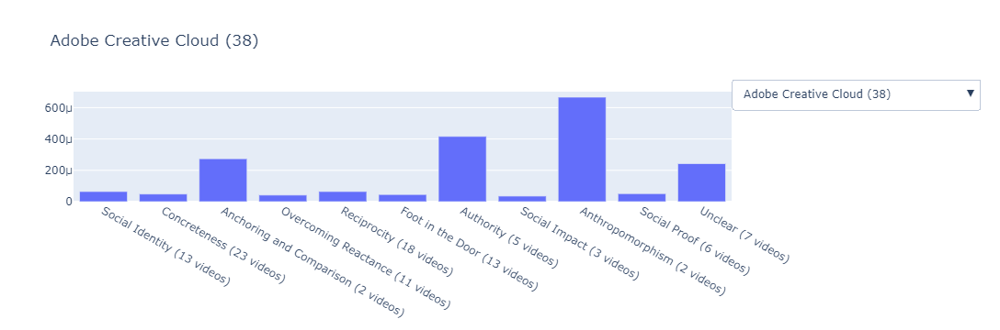

In [23]:
import plotly.graph_objects as go

bar_graphs = []
num_companies = len(companies)
plot_dicts = []
top_5_comments_to_views = []
j = 0

for company, content in companies.items():    
    company_views = {}
    company_comments = {}
    video_frequency = {}
    
    for pers in persuasions:
        company_views[pers] = 0
        company_comments[pers] = 0
        video_frequency[pers] = 0

    for video, values in content["videos"].items():
        strats = values["annots"]
        viewcount = values["viewCount"]
        comments = values["commentCount"]
        
        for strat in strats:
            video_frequency[strat] += 1
            company_views[strat] += viewcount
            company_comments[strat] += comments
    
    strat_names = []
    comments_to_views_ratios = []
    
    for key in company_views:
        if company_views[key] == 0:
            ratio = 0  # Avoid division by zero
        else:
            ratio = company_comments[key] / company_views[key]
        
        # Only include the strategy if the ratio is not zero
        if ratio != 0:
            strat_label = f"{key} ({video_frequency[key]} videos)"  # Include frequency in the label
            strat_names.append(strat_label)
            comments_to_views_ratios.append(ratio)
    
    if company in top_5_company_names:
        top_5_comments_to_views.append({
            "labels": strat_names,
            "name": company,
            "values": comments_to_views_ratios,
            "visible": False
        })

    visibility = [False] * num_companies
    visibility[j] = True
    
    # Create a bar graph for the comments-to-views ratio
    bar = go.Bar(x=strat_names, y=comments_to_views_ratios, name=company)
    bar_graphs.append(bar)
    
    d = dict(args=[{"visible": visibility}, {"title": company + " (" + str(content["count"]) + ")"}], 
             label=company + " (" + str(content["count"]) + ")", method="update")
    plot_dicts.append(d)
    j += 1

# Create the figure using bar graphs
fig = go.Figure(data=bar_graphs)
fig.update_layout(
    barmode='group',  # Set to 'stack' for stacked bars
    updatemenus=[dict(buttons=plot_dicts,
                      pad={"r": 10, "t": 10},
                      showactive=True,
                      x=1,
                      xanchor="left",
                      y=1.2,
                      yanchor="top")]
)

fig.show()


In [ ]:
print(top_5_company_names)

In [70]:
for i in range(5):
    comments_to_views_ratio = top_5_comments_to_views[i]['values']
    likes_to_views_ratio = top_5_likes_to_views[i]['values']
    
    cosine_similarity = 1 - cosine(comments_to_views_ratio, likes_to_views_ratio)
    
    print(f"Cosine similarity between Comments-to-Views Ratio and Likes-to-Views Ratio for {top_5_likes_to_views[i]['name']}: {cosine_similarity:.2f}")

Cosine similarity between Comments-to-Views Ratio and Likes-to-Views Ratio for Adobe Creative Cloud: 0.90
Cosine similarity between Comments-to-Views Ratio and Likes-to-Views Ratio for Netflix: 0.93
Cosine similarity between Comments-to-Views Ratio and Likes-to-Views Ratio for Viacom18 Studios: 0.94
Cosine similarity between Comments-to-Views Ratio and Likes-to-Views Ratio for Walt Disney Studios: 0.92
Cosine similarity between Comments-to-Views Ratio and Likes-to-Views Ratio for ultabeauty: 0.94


In [71]:
from scipy.stats import pearsonr

for i in range(5):
    comments_to_views_ratio = top_5_comments_to_views[i]['values']
    likes_to_views_ratio = top_5_likes_to_views[i]['values']

    corr, _ = pearsonr(comments_to_views_ratio, likes_to_views_ratio)
    print('Pearsons correlation: %.3f' % corr)

Pearsons correlation: 0.906
Pearsons correlation: 0.215
Pearsons correlation: 0.756
Pearsons correlation: 0.808
Pearsons correlation: 0.824


In [48]:
top_5_likes[1]['values'][0]

85226

In [57]:
rows, cols = (12, 5)
top_5_company_strats_likes = [[0]*cols]*rows
top_5_company_strats_comments = [[0]*cols]*rows

for j in range(5):
    for i in range(len(top_5_likes[j]['values'])):
        top_5_company_strats_likes[i][j] = top_5_likes[j]['values'][i]

        
for j in range(5):
    for i in range(len(top_5_comments[j]['values'])):
        top_5_company_strats_comments[i][j] = top_5_comments[j]['values'][i]

In [68]:
top_5_company_strats_likes[2]
print(top_5_likes[j]['values'])

(407, 329, 148, 268, 304, 236, 203, 45, 63, 45, 183, 89)


In [64]:
from sklearn.metrics.pairwise import cosine_similarity

strat_likes = [x for x in top_5_company_strats_likes]
print(strat_likes)
pairwise_cosine = cosine_similarity(strat_likes)
print(pairwise_cosine)

[[1753, 153238, 814, 8273, 89], [1753, 153238, 814, 8273, 89], [1753, 153238, 814, 8273, 89], [1753, 153238, 814, 8273, 89], [1753, 153238, 814, 8273, 89], [1753, 153238, 814, 8273, 89], [1753, 153238, 814, 8273, 89], [1753, 153238, 814, 8273, 89], [1753, 153238, 814, 8273, 89], [1753, 153238, 814, 8273, 89], [1753, 153238, 814, 8273, 89], [1753, 153238, 814, 8273, 89]]
[[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]]


In [54]:
for i in range(5):
    comments = top_5_comments[i]['values']
    likes = top_5_likes[i]['values']
    
    cosine_similarity = 1 - cosine(comments, likes)
    
    print(f"Cosine similarity between Comments and Likes for {top_5_likes_to_views[i]['name']}: {cosine_similarity:.2f}")

Cosine similarity between Comments and Likes for Adobe Creative Cloud: 0.99
Cosine similarity between Comments and Likes for Netflix: -0.58
Cosine similarity between Comments and Likes for Viacom18 Studios: 0.98
Cosine similarity between Comments and Likes for Walt Disney Studios: -1.00
Cosine similarity between Comments and Likes for ultabeauty: 0.99


In [31]:
for i in range(5):
    likes = top_5_likes[i]['values']
    likes_to_views_ratio = top_5_likes_to_views[i]['values']
    
    likes = normalize([likes])[0]
    likes_to_views_ratio = normalize([likes_to_views_ratio])[0]
    
    cosine_similarity = 1 - cosine(likes, likes_to_views_ratio)
    
    print(f"Cosine similarity between Likes and Likes-to-Views Ratio for {top_5_likes[i]['name']} {cosine_similarity:.2f}")

Cosine similarity between Likes and Likes-to-Views Ratio for Adobe Creative Cloud 0.49
Cosine similarity between Likes and Likes-to-Views Ratio for Netflix 0.78
Cosine similarity between Likes and Likes-to-Views Ratio for Viacom18 Studios 0.72
Cosine similarity between Likes and Likes-to-Views Ratio for Walt Disney Studios 0.71
Cosine similarity between Likes and Likes-to-Views Ratio for ultabeauty 0.63


In [32]:
for i in range(5):
    comments = top_5_comments[i]['values']
    comments_to_views_ratio = top_5_comments_to_views[i]['values']
    
    comments = normalize([comments])
    comments_to_views_ratio = normalize([comments_to_views_ratio])
    
    cosine_similarity = 1 - cosine(comments, comments_to_views_ratio)
    
    print(f"Cosine similarity between Comments and Comments-to-Views Ratio for {top_5_comments[i]['name']} {cosine_similarity:.2f}")

Cosine similarity between Comments and Comments-to-Views Ratio for Adobe Creative Cloud 0.19
Cosine similarity between Comments and Comments-to-Views Ratio for Netflix 0.75
Cosine similarity between Comments and Comments-to-Views Ratio for Viacom18 Studios 0.69
Cosine similarity between Comments and Comments-to-Views Ratio for Walt Disney Studios 0.52
Cosine similarity between Comments and Comments-to-Views Ratio for ultabeauty 0.69


# Sector-wise

## Persuasion Strategies used within same sector

In [100]:
sectors = {}
for sector in sector_list:
    sectors[sector] = {"count":0, "num_companies":0, "videos":{}}

for video, values in data.items():
    sec = values["sector"]
    company = values["channelTitle"]
    for sector in sectors:
        if sec in sector:
            y = values["publishedAt"][0:4]
            if int(y) <= 2013:
                y = "Before 2014"
            sectors[sector]["count"] += 1
            sectors[sector]["videos"][video] = {"annots":values["annots"], "commentCount": values['commentCount'], "channelTitle":company, "publishedIn": y, "likeCount": values["likeCount"],
                                                 "viewCount":values["viewCount"], "videoTag":"video "+str(companies[company]["count"])}

In [101]:
sector_list_org = {"Technology": {}, "Media": {}, "Retailing": {}, "Apparel": {}, "Finance": {}, "Food": {}, "Household": {}, 
               "Wholesalers": {}, "Industrials": {}, "Energy": {}, "Transportation": {}, "Aerospace and Defence": {}, "Healthcare": {}}
for video, values in data.items():
    sector = values["sector"]
    company = values["channelTitle"]
    if company not in sector_list_org:
        sector_list_org[values["sector"]][company] = 0

for sector in sector_list_org:
    sector_list_org[sector] = len(sector_list_org[sector])

In [102]:
for sector, vals in sectors.items():
    unique_comp = {}
    for _, content in vals["videos"].items():
        unique_comp[content["channelTitle"]] = 0
    vals["num_companies"] = len(unique_comp)

### Frequency of sectors

In [75]:
df_sectors_pers = {}
for sector, values in sectors.items():
    df_sectors_pers[sector] = {"freq":values["count"], "company_freq":values["num_companies"]}

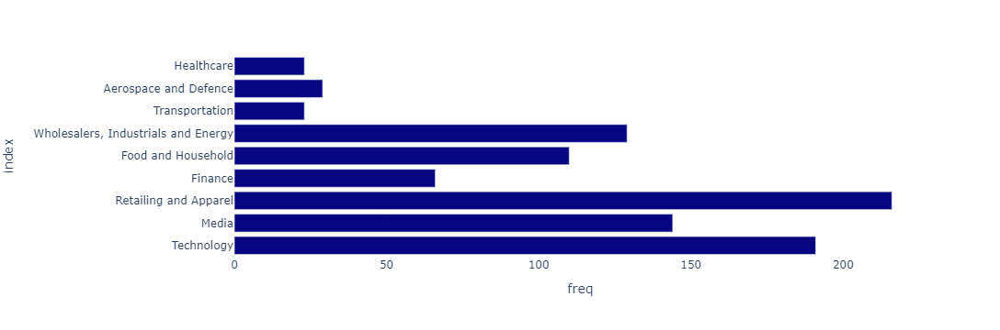

In [76]:
df_freq_sectors = pd.DataFrame.from_dict(df_sectors_pers).T
fig = px.bar(df_freq_sectors, x="freq", color_discrete_sequence=["#090580"])
fig.update_layout({
    "plot_bgcolor": "rgba(0,0,0,0)",
    "paper_bgcolor": "rgba(0,0,0,0)"
})
fig.show()
# plotly.offline.plot({"data": fig}, filename = "Frequency of sectors.html")

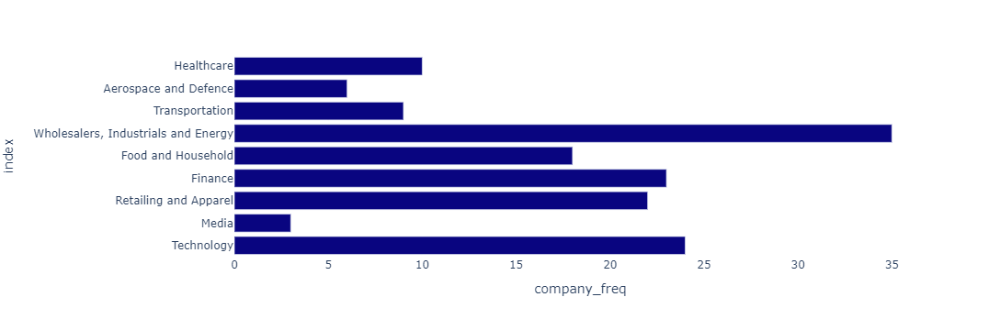

In [77]:
df_freq_sectors = pd.DataFrame.from_dict(df_sectors_pers).T
fig = px.bar(df_freq_sectors, x="company_freq", color_discrete_sequence=["#090580"])
fig.update_layout({
    "plot_bgcolor": "rgba(0,0,0,0)",
    "paper_bgcolor": "rgba(0,0,0,0)"
})
fig.show()

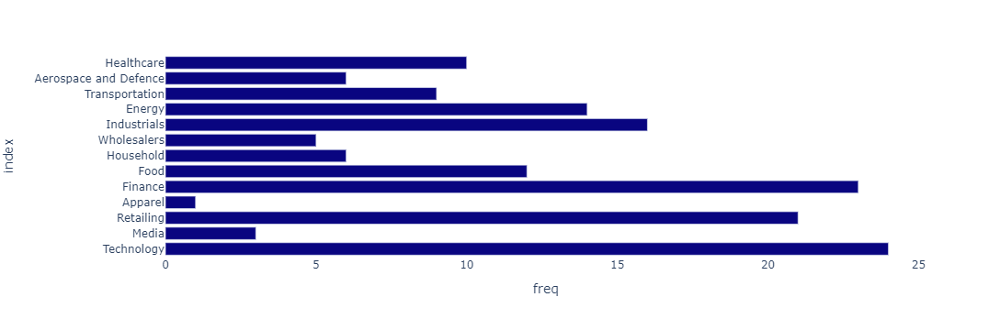

In [78]:
df_sectors_org = {}
for sector, values in sector_list_org.items():
    df_sectors_org[sector] = {"freq":values}

df_sectors_org = pd.DataFrame.from_dict(df_sectors_org).T
fig = px.bar(df_sectors_org, x="freq", color_discrete_sequence=["#090580"])
fig.update_layout({
    "plot_bgcolor": "rgba(0,0,0,0)",
    "paper_bgcolor": "rgba(0,0,0,0)"
})
fig.show()

### Sector vs Strategies

In [99]:
df_sectors_pers = {}
for sector in sectors:
    df_sectors_pers[sector] = {}
    for pers in persuasions:
        df_sectors_pers[sector][pers] = 0

for sector, values in sectors.items():
    for video, content in values['videos'].items():
        print(content)
        break
    break
        # for strat in content["annots"]:
        #     df_sectors_pers[sector][strat] += 1

{'annots': ['Concreteness', 'Social Identity'], 'channelTitle': 'ebay', 'publishedIn': '2016', 'likeCount': 4, 'viewCount': 3180, 'videoTag': 'video 8'}


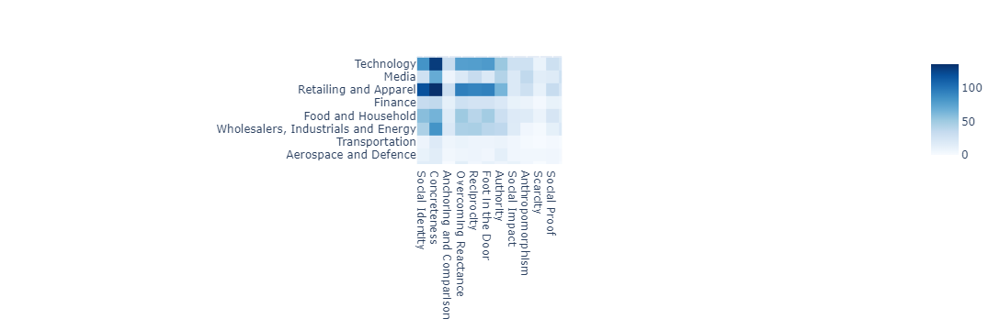

In [80]:
df_sectors_pers = pd.DataFrame.from_dict(df_sectors_pers).T
fig = px.imshow(df_sectors_pers, color_continuous_scale=px.colors.sequential.Blues)
fig.show()
# plotly.offline.plot({"data": fig}, filename = "Sector vs Strategies.html")

### Sector vs Strategies normalized

In [81]:
df_sectors_pers = df_sectors_pers.T.to_dict()
for sector, values in df_sectors_pers.items():
    total = sum(values.values())*len(sectors)
    for strat, value in values.items():
        df_sectors_pers[sector][strat] /= total

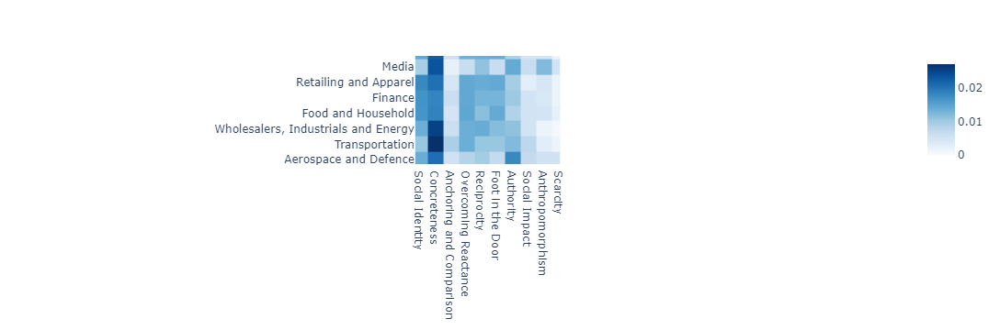

In [82]:
df_sectors_pers = pd.DataFrame.from_dict(df_sectors_pers).T
fig = px.imshow(df_sectors_pers, color_continuous_scale=px.colors.sequential.Blues)
fig.show()
# plotly.offline.plot({"data": fig}, filename = "Sector vs Strategies (normalized).html")

## Likes

In [109]:
df_sectors_pers_likes = {}
for sector in sectors:
    df_sectors_pers_likes[sector] = {}
    for pers in persuasions:
        df_sectors_pers_likes[sector][pers] = 0

for sector, values in sectors.items():
    for video, content in values['videos'].items():
        for strat in content["annots"]:
            df_sectors_pers_likes[sector][strat] += content['likeCount']/total_likes

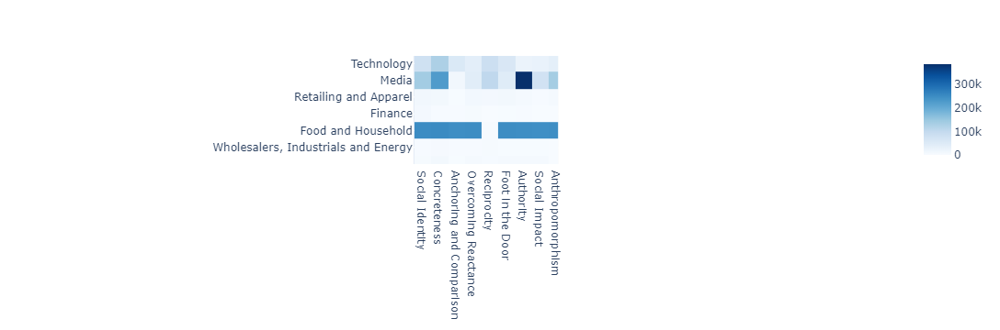

In [86]:
df_sectors_pers_likes = pd.DataFrame.from_dict(df_sectors_pers_likes).T
fig = px.imshow(df_sectors_pers_likes, color_continuous_scale=px.colors.sequential.Blues)
fig.show()
# plotly.offline.plot({"data": fig}, filename = "Sector vs Strategies.html")

### Normalized

In [113]:
df_sectors_pers_likes = {}
for sector in sectors:
    df_sectors_pers_likes[sector] = {}
    for pers in persuasions:
        df_sectors_pers_likes[sector][pers] = 0

for sector, values in sectors.items():
    total_likes = sum(content['likeCount'] for video, content in values['videos'].items())
    for video, content in values['videos'].items():
        for strat in content["annots"]:
            df_sectors_pers_likes[sector][strat] += content['likeCount']/total_likes

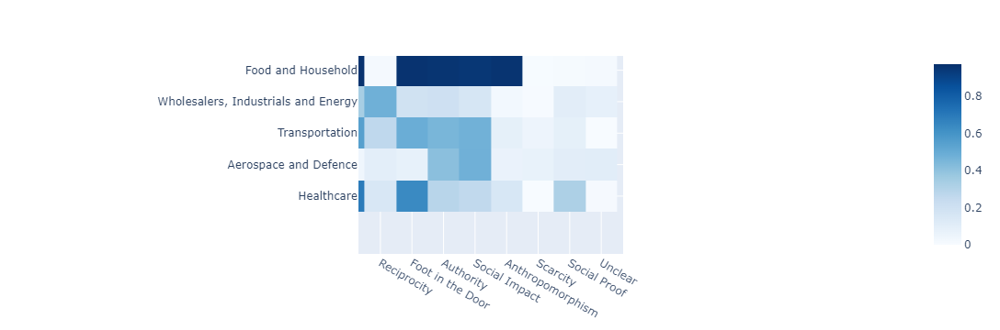

In [115]:
df_sectors_pers_likes = pd.DataFrame.from_dict(df_sectors_pers_likes).T
fig = px.imshow(df_sectors_pers_likes, color_continuous_scale=px.colors.sequential.Blues)
fig.show()

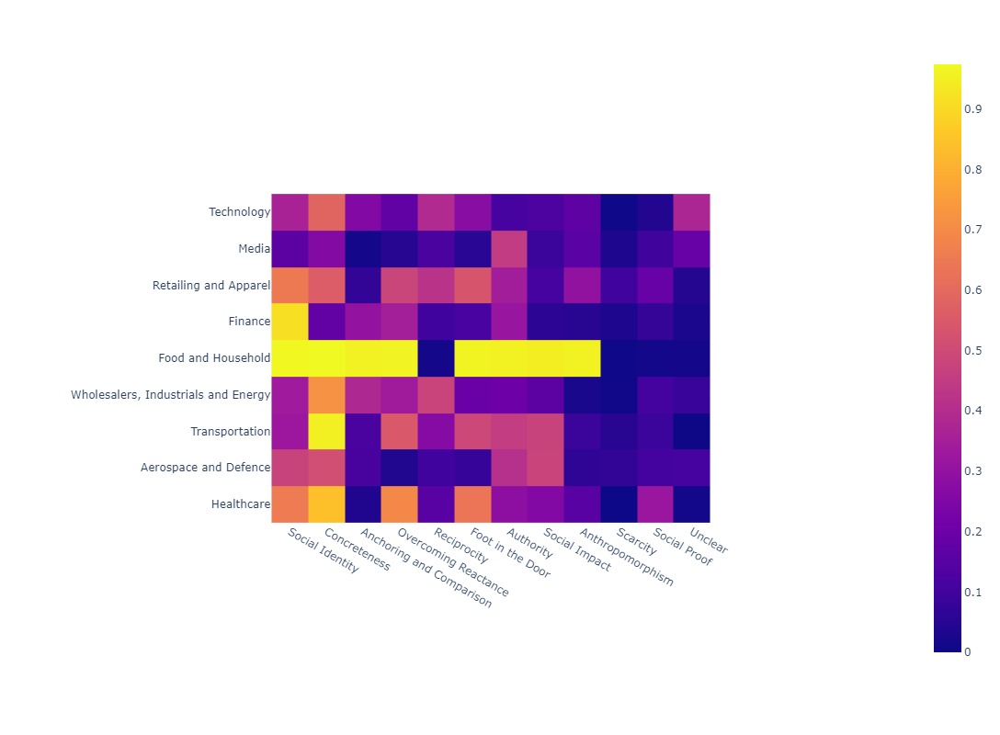

In [119]:
import plotly.express as px

fig = px.imshow(df_sectors_pers_likes, width=800, height=800)

fig.show()

## Comments

In [103]:
df_sectors_pers_comments = {}
for sector in sectors:
    df_sectors_pers_comments[sector] = {}
    for pers in persuasions:
        df_sectors_pers_comments[sector][pers] = 0

for sector, values in sectors.items():
    for video, content in values['videos'].items():
        for strat in content["annots"]:
            df_sectors_pers_comments[sector][strat] += content['commentCount']

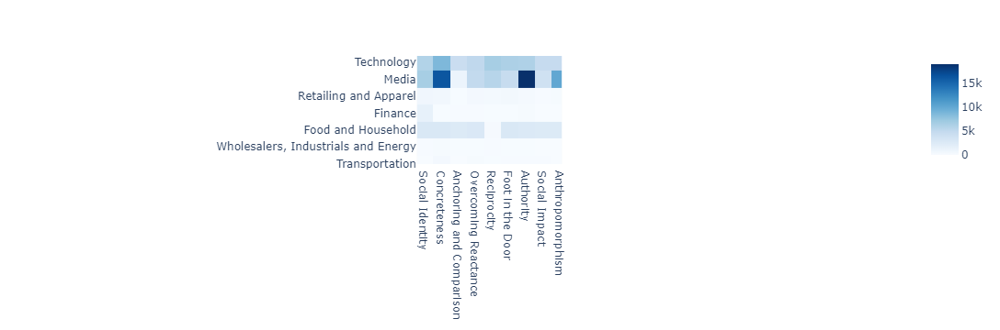

In [104]:
df_sectors_pers_comments = pd.DataFrame.from_dict(df_sectors_pers_comments).T
fig = px.imshow(df_sectors_pers_comments, color_continuous_scale=px.colors.sequential.Blues)
fig.show()
# plotly.offline.plot({"data": fig}, filename = "Sector vs Strategies.html")

## Trend of strategies over the years in each sector

In [ ]:
for sector, values in sectors.items():
    sector_years = {}
    for year in year_list:
        sector_years[year] = {}
        for pers in persuasions:
            sector_years[year][pers] = 0
    
    for video, content in values["videos"].items():
        year = content["publishedIn"]
        strats = content["annots"]
        for strat in strats:
            sector_years[year][strat] += 1
    
    year_values=[]
    for year, content in sector_years.items():
        buff = []
        for strat, value in content.items():
            buff.append(value)
        year_values.append(buff)
    year_values = np.transpose(year_values)
    
    buff_graphs = []
    plot_dicts = []
    
    for i, pers in enumerate(persuasions):
        visibility = [False]*len(persuasions)
        visibility[i] = True
        buff_graphs.append(go.Scatter(x=year_list, y=year_values[i], name=pers, line={ 'width': 2}))
        d = dict(args=[{"visible": visibility}, {"title": sector + " (" + str(values["count"]) + ")"}], 
             label=pers, method="update")
        plot_dicts.append(d)

    fig = go.Figure(data = buff_graphs)
    fig.update_layout(
        updatemenus=[
            dict(buttons= plot_dicts,
                          pad={"r": 10, "t": 10},
                          showactive=True,
                          x=1,
                          xanchor="left",
                          y=1.2,
                          yanchor="top")
        ]
    )
    j+=1
    fig.show()
#     plotly.offline.plot({"data": fig}, filename = "Trend of strategies over the years in " + sector + ".html")

In [ ]:
graphs_v = []
graphs_l = []
num_sectors = len(sectors)
plot_dicts = []
j = 0
for sector, content in sectors.items():   
    sector_views = {}
    sector_likes = {}
    video_frequency = {}
    for pers in persuasions:
        sector_views[pers] = 0
        sector_likes[pers] = 0
        video_frequency[pers] = 0

    for video, values in content["videos"].items():
        strats = values["annots"]
        viewcount = values["viewCount"]
        likes = values["likeCount"]
        for strat in strats:
            video_frequency[strat] += 1
            sector_views[strat] += viewcount
            sector_likes[strat] += likes
    
#     for key in company_views:
#         if video_frequency[key] != 0:
#             company_views[key] /= video_frequency[key]
#             company_likes[key] /= video_frequency[key]
    
    strat_names = []
    v = []
    l = []
    for key in sector_views:
        if sector_views[key] == 0 and sector_likes[key] == 0:
            pass
        else:
            strat_names.append(key)
            v.append(sector_views[key])
            l.append(sector_likes[key])
            
    g = go.Pie(labels=strat_names, values=v, name = company)
    graphs_v.append(g)
    g = go.Pie(labels=strat_names, values=l, name = company)
    graphs_l.append(g)

    visibility = [False]*num_sectors
    visibility[j] = True
    d = dict(args=[{"visible": visibility}, {"title": sector + " (" + str(content["count"]) + ")"}], 
             label=sector, method="update")
    plot_dicts.append(d)
    j+=1

fig = go.Figure(data = graphs_v)
fig.update_layout(
    updatemenus=[dict(buttons= plot_dicts,
                      pad={"r": 10, "t": 10},
                      showactive=True,
                      x=1,
                      xanchor="left",
                      y=1.2,
                      yanchor="top")]
)
fig.show()
plotly.offline.plot({"data": fig}, filename = "Trend of number of views per video gathered by each sector.html")
fig = go.Figure(data = graphs_l)
fig.update_layout(
    updatemenus=[dict(buttons= plot_dicts,
                      pad={"r": 10, "t": 10},
                      showactive=True,
                      x=1,
                      xanchor="left",
                      y=1.2,
                      yanchor="top")]
)
fig.show()
plotly.offline.plot({"data": fig}, filename = "Trend of number of likes per video gathered by each sector.html")